# Simple current injection experiments

This notebook guides the user through steps on how to run biohysically detailed full compartmental simulations using ISF. It shows which file formats are used to interact with NEURON and to set up simulations in a low-level way. The [next noteobok](./02_biophysics) will show how to simplify the interaction with biophysical parameters, and [tutorial 3: biophysics degeneracy](./03_biophysics_degeneracy.ipynb) will show how to generate multiple biophysical models yourself.

In [1]:
import Interface as I
# set up cell. This creates a lot of (interesting) diagnostic output. Remove the context manager to see it
from simrun2.utils import scale_apical
import Interface as I
from getting_started import getting_started_dir # path to getting started folder

trying to connect to distributed locking server {'config': {'hosts': 'somalogin02-hs:33333'}, 'type': 'zookeeper'}
success!
[INFO] ISF: Current version: heads/publish+0.g672bbea4.dirty
[INFO] ISF: Current pid: 215937


--No graphics will be displayed.


[INFO] mechanisms: Loading mechanisms:



[INFO] ISF: Loaded modules with __version__ attribute are:
IPython: 8.12.3, Interface: heads/publish+0.g672bbea4.dirty, PIL: 8.2.0, _csv: 1.0, _ctypes: 1.1.0, _curses: b'2.2', _decimal: 1.70, argparse: 1.1, attr: 20.3.0, backcall: 0.2.0, blake3: 0.3.3, blosc: 1.10.2, bluepyopt: 1.9.126, bottleneck: 1.3.2, cffi: 1.14.3, click: 7.1.2, cloudpickle: 1.6.0, colorama: 0.4.4, comm: 0.2.1, csv: 1.0, ctypes: 1.1.0, cycler: 0.10.0, cytoolz: 0.11.0, dash: 2.9.3, dask: 2.30.0, dateutil: 2.8.2, deap: 1.3, debugpy: 1.8.0, decimal: 1.70, decorator: 4.4.2, distributed: 2.30.1, distutils: 3.8.5, executing: 2.0.1, filelock: 3.0.12, flask: 1.1.2, flask_cors: 4.0.0, frozendict: 2.3.8, fsspec: 0.8.3, future: 0.18.2, gevent: 20.9.0, greenlet: 0.4.17, ipaddress: 1.0, ipykernel: 6.29.0, ipython_genutils: 0.2.0, ipywidgets: 7.5.1, itsdangerous: 1.1.0, jedi: 0.17.1, jinja2: 3.0.3, joblib: 1.3.2, json: 2.0.9, jupyter_client: 8.6.0, jupyter_core: 5.7.1, kazoo: 2.8.0, kiwi

Connection dropped: socket connection broken
Transition to CONNECTING
Session has expired
Connection dropped: socket connection broken
Transition to CONNECTING
Session has expired


## Equipping a morphology with biophysics

Given a reconstructed cell morphology, it still needs biophysical attributes in order to perform cellular computations. This section will introduce a format for biophysical parameters, and how to apply them to a cell morphology.

The module [`single_cell_parser`](../../../single_cell_parser/__init__.py) takes care of equipping a morphology with biophysical parameters, in a format that works with NEURON. Such a format looks somewhat like this:

In [2]:
cell_param = I.os.path.join(
    getting_started_dir,
    'biophysical_constraints',
    '86_CDK_20041214_BAC_run5_soma_Hay2013_C2center_apic_rec.param')
with open(cell_param, 'r') as f:
    print(f.read())


{	
	"info":
	{
		"name":		"hay_2011_dend_test", 
		"author":	"regger",
		"date": 	"15Oct2014",
	},
	
	"NMODL_mechanisms":
	{
        "channels": "/",
	},
	
	"mech_globals":
	{
	},
	
	"neuron":
	{
		"filename": "/gpfs/soma_fs/scratch/meulemeester/project_src/in_silico_framework/getting_started/anatomical_constraints/86_L5_CDK20041214_nr3L5B_dend_PC_neuron_transform_registered_C2center.hoc",
		
		"Soma":
		{
			"properties":
			{
				"Ra": 100.0,
				"cm": 1.0,
                
                "ions":
                {
                    "ek": -85.0,
                    "ena": 50.0,
                },
			},
			
			"mechanisms":
			{
				"global":
				{
					
				},
				
				"range":
				{
                    "pas":
                    {
                        "spatial": "uniform",
                        "g": 0.0000326,
                        "e": -90,
                    },
                    "Ca_LVAst":
                    {
                        "spatial": "uniform",
          

the variable `cell_param` is one big dictionary-like object, including information on:
- the spatial distribution of ion channels
- $Ca^{2+}$ buffering dynamics
- default simulation parameters (time interval and resolution)
- [recording site locations](../../apical_proximal_distal_rec_sites.landmarkAscii)
- passive properties (capacitance, input resistance, and reversal potentials)
- [the morphology file](../../anatomical_constraints/86_L5_CDK20041214_nr3L5B_dend_PC_neuron_transform_registered_C2center.hoc). 

This is a precomputed example file. We will show examples on how to find values for biophysical parameters in [tutorial 3: biophysics degeneracy](./03_biophysics_degeneracy.ipynb).

It can be quite tedious to work directly with this file, and [the next notebook](./02_biophysics.ipynb) will show methods that vastly simplify interaction with biophysical parameters. This format is simply what is being used in the backend to directly interact with NEURON.

For now, let's add these biophysical details to our morphology:

In [3]:
cell_param = I.scp.build_parameters(cell_param) # this is the main method to load in parameterfiles
cell = I.scp.create_cell(cell_param.neuron, scaleFunc = scale_apical)

We now have a biophysically detailed cell object. Let's start by figuring out some general morphological properties of the example cell

In [4]:
length = sum([
    sec.L for sec in cell.sections])
dendrite_length = sum([
    sec.L for sec in cell.sections if sec.label in ['Soma', 'Dendrite', 'ApicalDendrite']])
soma_area = sum([
    sec.area for sec in cell.sections if sec.label == 'Soma'])
apic_area = sum([
    sec.area for sec in cell.sections if sec.label == 'ApicalDendrite'])


print('total length = {:.0f} micron'.format(length))
print('total dendritic length = {:.0f} micron'.format(dendrite_length))
print('soma area = {:.0f} micron^2'.format(soma_area))
print('apical dendrite area = {:.0f} micron^2'.format(apic_area))

total length = 16340 micron
total dendritic length = 15290 micron
soma area = 916 micron^2
apical dendrite area = 27212 micron^2


The respective hoc morphology has a very thin apical dendrite which does not allow electric coupling between apical dendrite and soma. We figured that it is necessary to scale up the diameter of the trunc.
<a id='WhyWeNeedScaling'></a>

In [5]:
# load scaled hoc morphology
cell_param.neuron.filename = I.os.path.join(getting_started_dir, 'anatomical_constraints', \
                            '86_L5_CDK20041214_nr3L5B_dend_PC_neuron_transform_registered_C2center_scaled_diameters.hoc')
with I.silence_stdout:
    cell = I.scp.create_cell(cell_param.neuron)
print('apical dendrite area = {:.0f} micron^2'.format(sum([sec.area for sec in cell.sections \
                                                           if sec.label == 'ApicalDendrite'])))

apical dendrite area = 27212 micron^2


What does this morphology look like?

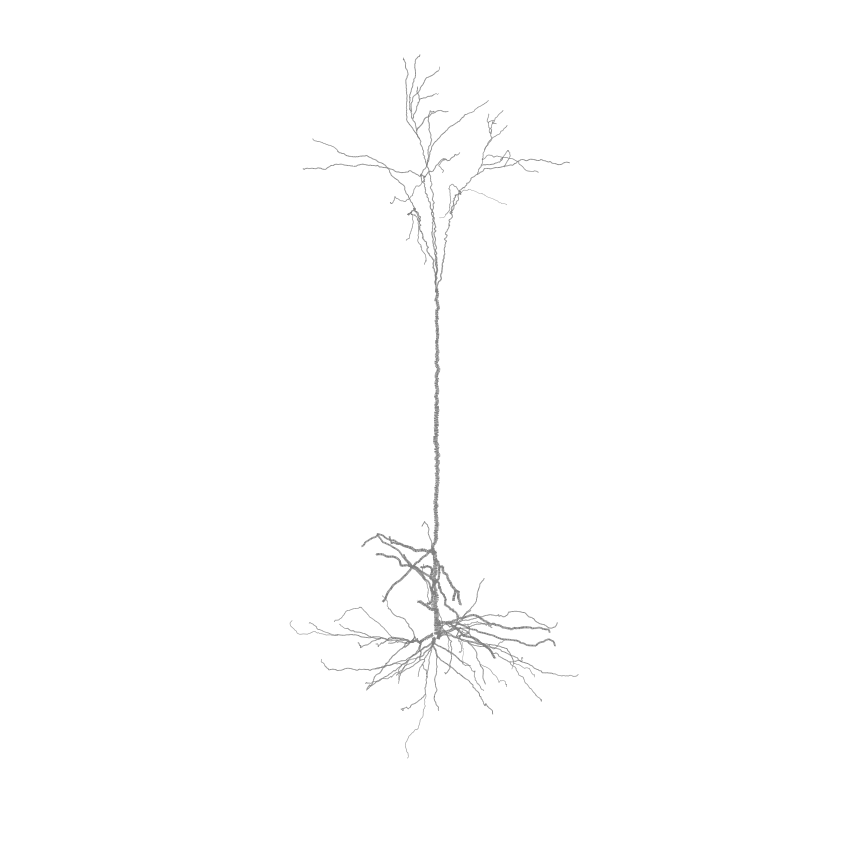

In [6]:
from visualize.cell_morphology_visualizer import CellMorphologyVisualizer
import matplotlib
%matplotlib inline
cmv = CellMorphologyVisualizer(cell)
fig = cmv.plot();

Or an interactive plot:

In [21]:
from visualize.cell_morphology_visualizer import CellMorphologyInteractiveVisualizer
cmiv = CellMorphologyInteractiveVisualizer(cell)
fig = cmiv.interactive_plot(renderer="iframe_connected");

## Current injections

Given that our cell has biophysical attributes, we can run some simulations with it. Let's begin with some simple current injection experiments. We can use the NEURON API for this (i.e. just `neuron.h`), but later, we will cover more high-level ways of running predefined current injection protocols.

### Current injection at the soma

In [8]:
import neuron
h = neuron.h

In [9]:
iclamp = h.IClamp(0.5, sec=cell.soma)
iclamp.delay = 150 # [ms] give the cell time to reach steady state
iclamp.dur = 5 # [ms] rectangular pulse
iclamp.amp = 1.9 # [nA]
%time I.scp.init_neuron_run(cell_param.sim, vardt=True) # run the simulation 

CPU times: user 549 ms, sys: 951 µs, total: 550 ms
Wall time: 551 ms


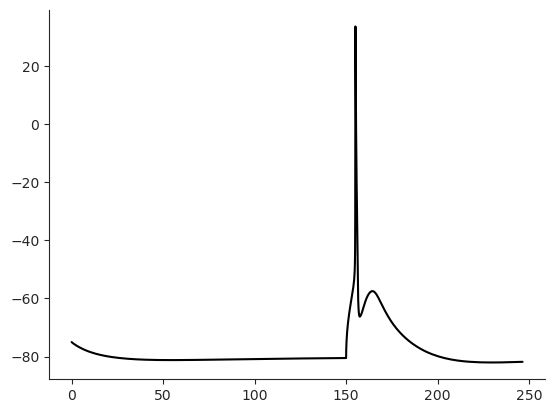

In [10]:
%matplotlib inline
I.sns.set_style('ticks')
I.plt.plot(cell.tVec, cell.soma.recVList[0], c = 'k');
I.sns.despine()

### Step currents at the soma

How does the cell respond to different amplitudes of the step current?

In [11]:
cell_param.sim.tStop = 3000
iclamp.dur = 2000
iclamp.delay = 500
simresult = {}
for amp in [0.619, 0.793, 1.507]:
    iclamp.amp = amp
    I.scp.init_neuron_run(cell_param.sim, vardt=True)
    simresult[amp] = I.np.array(cell.tVec), I.np.array(cell.soma.recVList[0])

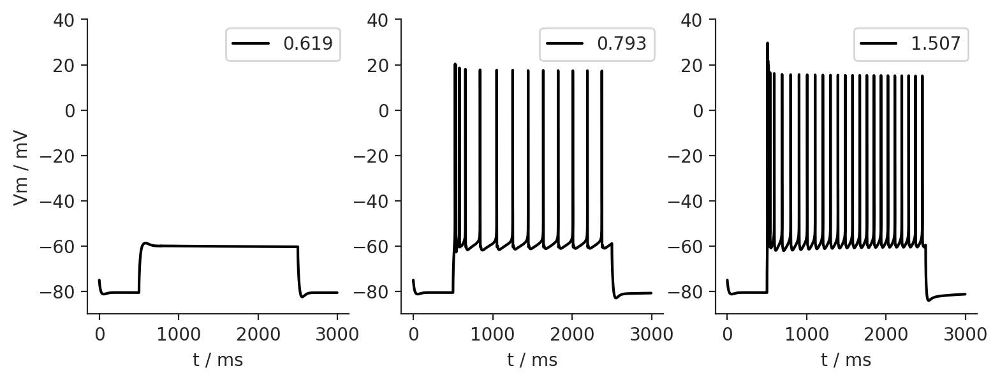

In [12]:
fig = I.plt.figure(figsize = (9,3), dpi = 200)
for lv, k in enumerate(sorted(simresult.keys())):
    ax = fig.add_subplot(1,3,lv+1)
    ax.plot(*simresult[k], label = k, c = 'k');
    ax.legend(loc = 'upper right')
    ax.set_ylim([-90, 40])
    ax.set_xlabel('t / ms')
    if lv == 0:
        ax.set_ylabel('Vm / mV')
I.sns.despine()

### Pair injection at the soma and apical dendrite

Now let's place a pipette on the apical trunk at a soma distance of 620 microns and inject current synchronously at this position and at the soma. For the current at the soma, we choose a rectangular pulse again. The current at the apical injection site should resemble the shape of a evoked post synaptic potential (epsp). Have a look at the folder mechanisms/synapses to see how epsp is implemented in hoc code.

In [13]:
# map between sections and somadistance
sec_dist_dict = {cell.distance_to_soma(sec, 1.0): sec for sec in cell.sections}

def get_section_at_distance(cell, dist):
    dummy = {k - dist: v for k,v in sec_dist_dict.items() if k > dist}
    closest_sec = dummy[min(dummy)]
    x = (dist - cell.distance_to_soma(closest_sec, 0.0)) / closest_sec.L
    return x, closest_sec

In [14]:
cell_param.sim.tStop = 500
x, sec = get_section_at_distance(cell, 620)

iclamp = h.IClamp(0.5, sec=cell.soma)
iclamp.delay = 295 # give the cell time to reach steady state
iclamp.dur = 5 # 5ms rectangular pulse
iclamp.amp = 1.9 # 1.9 ?? todo ampere

iclamp2 = h.epsp(x, sec=sec)
iclamp2.onset = 300
iclamp2.imax = 0.5
iclamp2.tau0 = 1.0 # rise time constant
iclamp2.tau1 = 5 # decay time constant
cell.iclamp2 = iclamp2

%time I.scp.init_neuron_run(cell_param.sim, vardt=True) # run the simulation 

CPU times: user 1.1 s, sys: 4.92 ms, total: 1.1 s
Wall time: 1.1 s


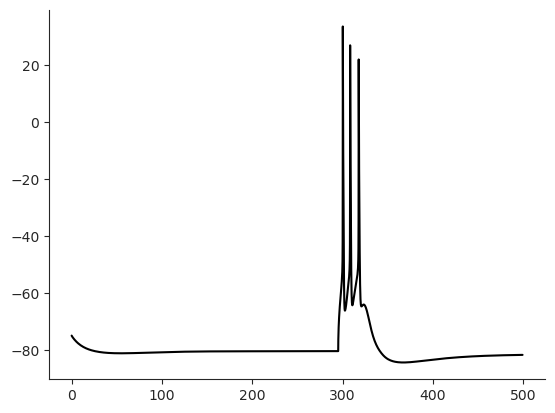

In [15]:
I.plt.plot(cell.tVec, cell.soma.recVList[0], c = 'k');
I.sns.despine()

## Visualization

So far, we have only visualized the somatic membrane potential. Now, we create a short animation, where the whole dendrite is visualized (x-axis: soma distance of dendrite segment, y-axis: Vm)

In [16]:
import os
db = I.DataBase('{}/labs/getting_started_db/'.format(os.environ['HOME'])) # create a DataBase to save .png-frames of the animation


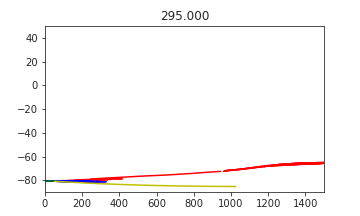
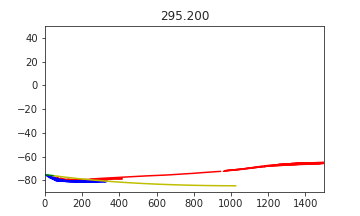
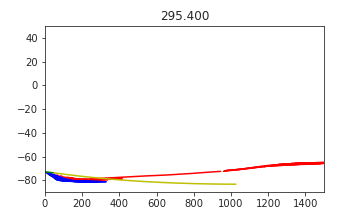
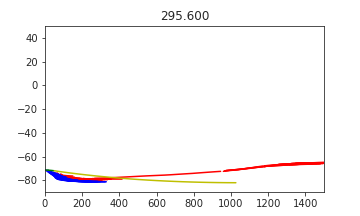
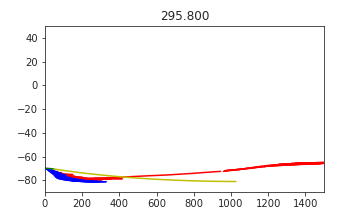
...
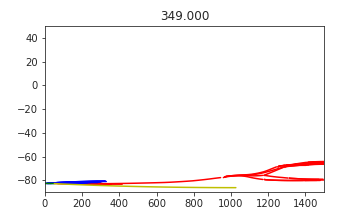
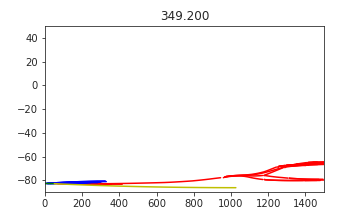
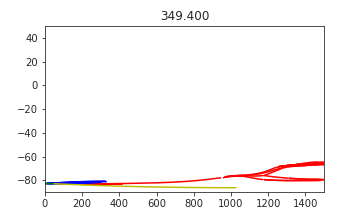
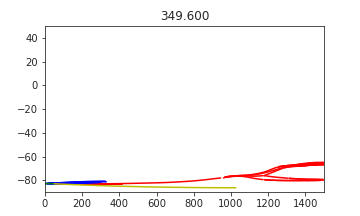
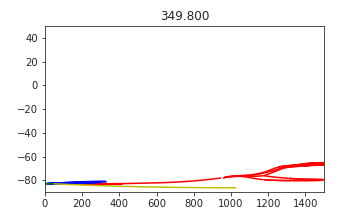

In [17]:
if not 'burst_trail_video' in db.keys():
    I.scp.init_neuron_run(cell_param.sim, vardt=False) # fixed step size necessary for animation
    I.cell_to_animation(cell, \
                        xlim = [0,1500], \
                        ylim = [-90, 50], \
                        tstart = 295, \
                        tend = 350, \
                        tstep = 0.2, \
                        outdir = db.create_managed_folder('burst_trail_video'))
I.display_animation(db['burst_trail_video'].join('*', '*.png'), embedded=True);

We can also visualize current through ion channels. Let's have a look at the calcium current through low voltage activated calcium channels:

[WARNING] isf_data_base: The database source folder has uncommitted changes!
parallelMovieMaker
files are here: /gpfs/soma_fs/home/meulemeester/labs/getting_started_db/burst_trail_ca_current_video/animation_5b8zirh3/*.png



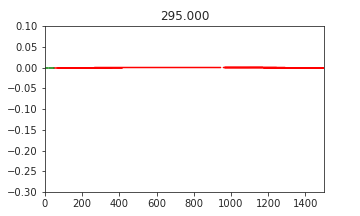
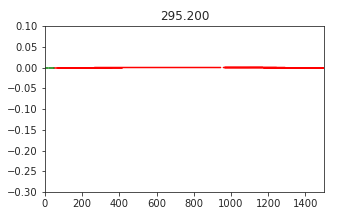
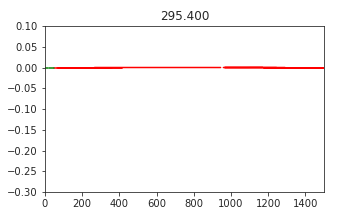
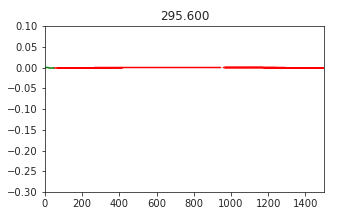
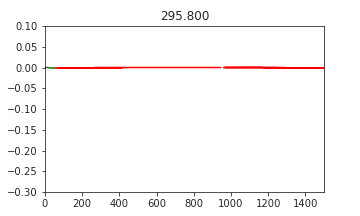
...
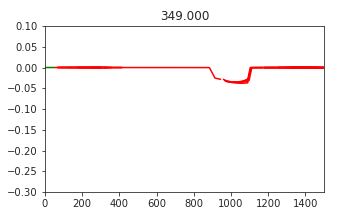
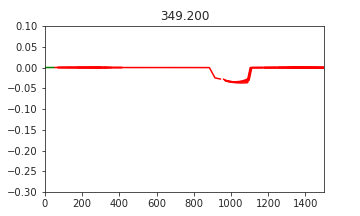
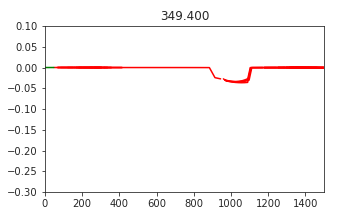
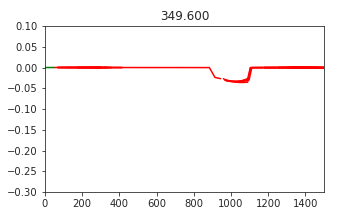
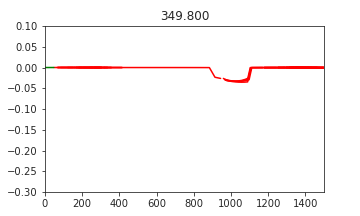

In [130]:
# # to re-create this video, comment out below
# del db['burst_trail_ca_current_video']

if not 'burst_trail_ca_current_video' in db.keys():
    cell.record_range_var('Ca_LVAst.ica') # have a look at the mechanisms folder to find available range vars
    I.scp.init_neuron_run(cell_param.sim, vardt=False)
    I.cell_to_animation(
        cell,
        xlim = [0,1500],
        ylim = [-0.3, 0.1],
        tstart = 295,
        tend = 350,
        tstep = 0.2,
        outdir = db.create_managed_folder('burst_trail_ca_current_video'),
        range_vars = 'Ca_LVAst.ica')    
I.display_animation(db['burst_trail_ca_current_video'].join('*', '*png'), embedded = True);

If you want to visualize the entire dendritic tree, that's also possible, although a bit slower. Here, we use Dask to parallellize frame generation of the membrane voltage across the entire dendritic tree. You can use the +/- buttons to speed up or slow down the animation, or play around with the t_step parameter


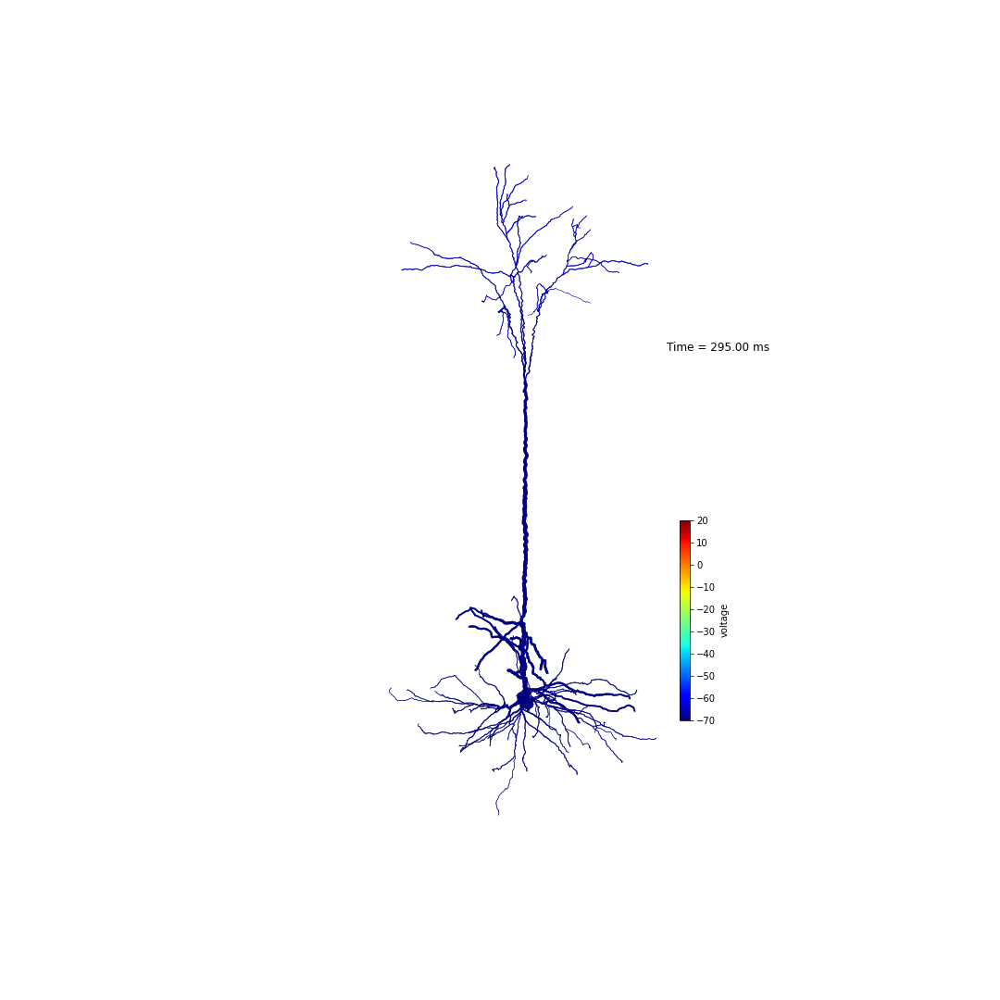
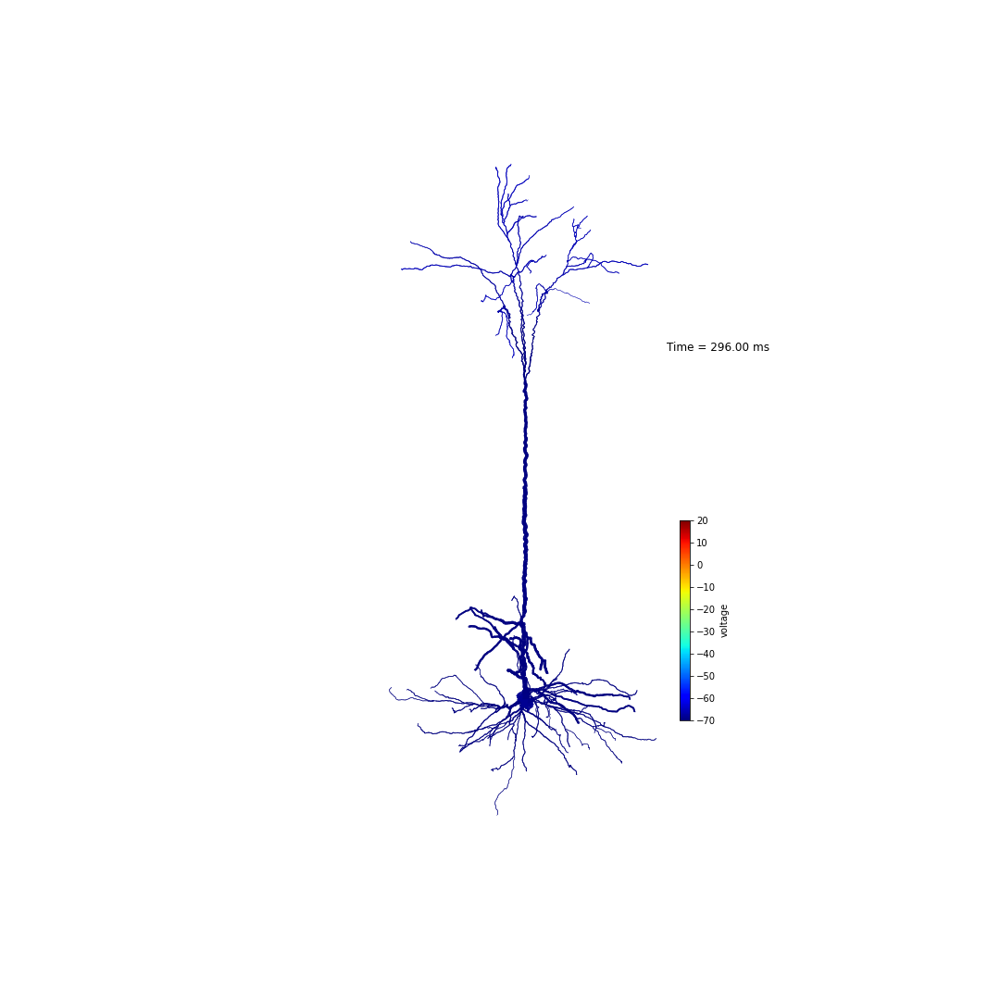
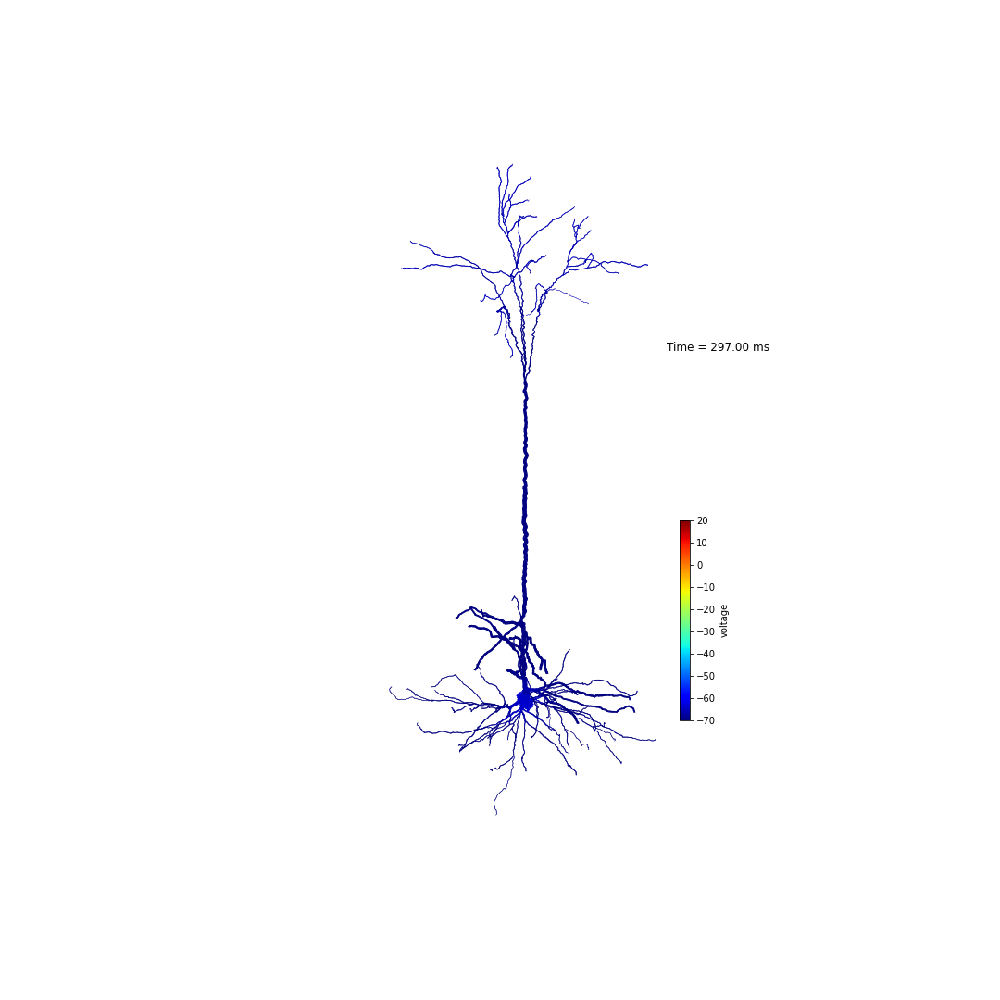
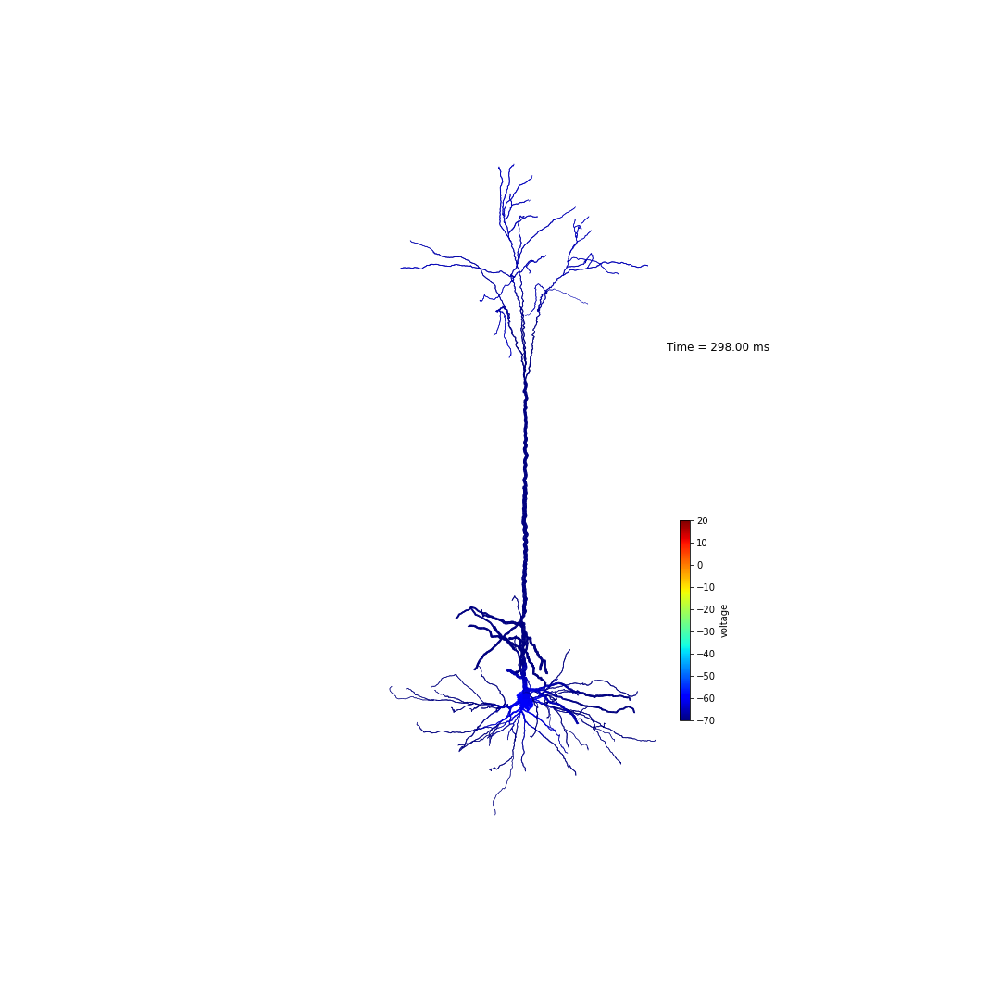
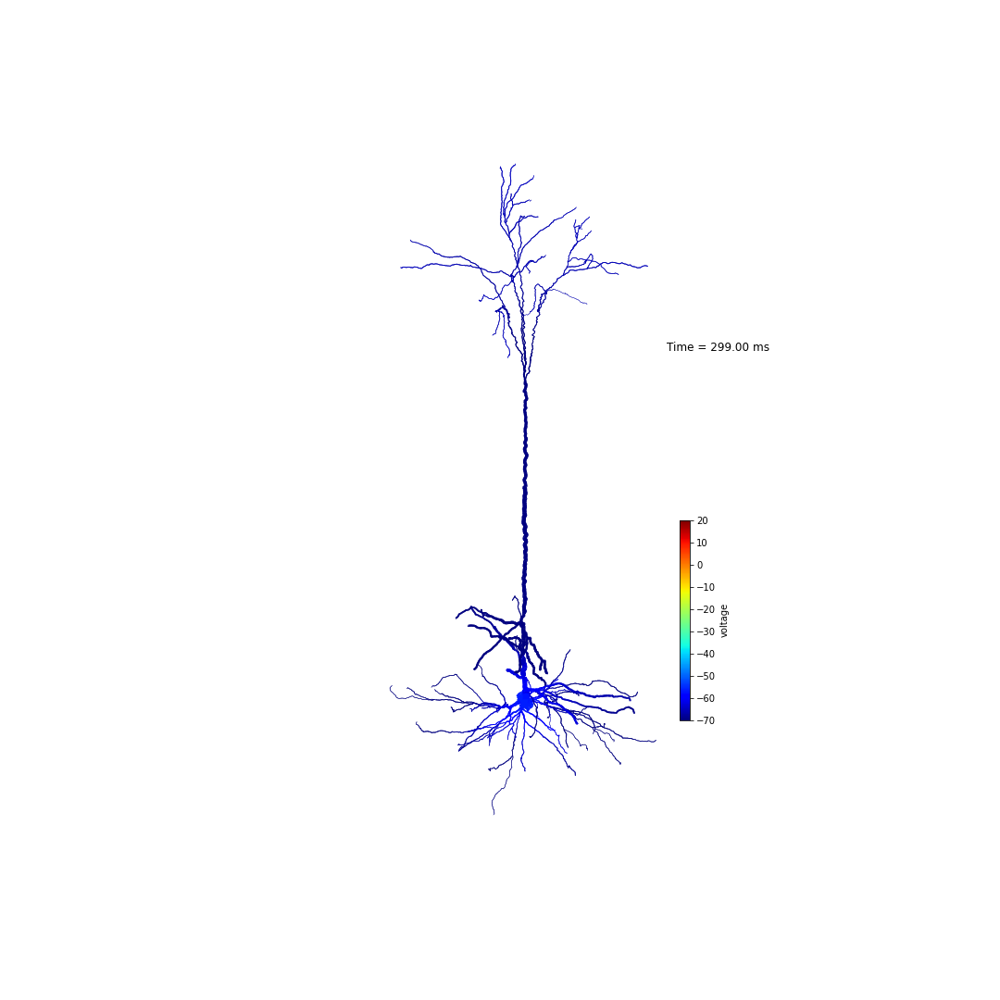
...
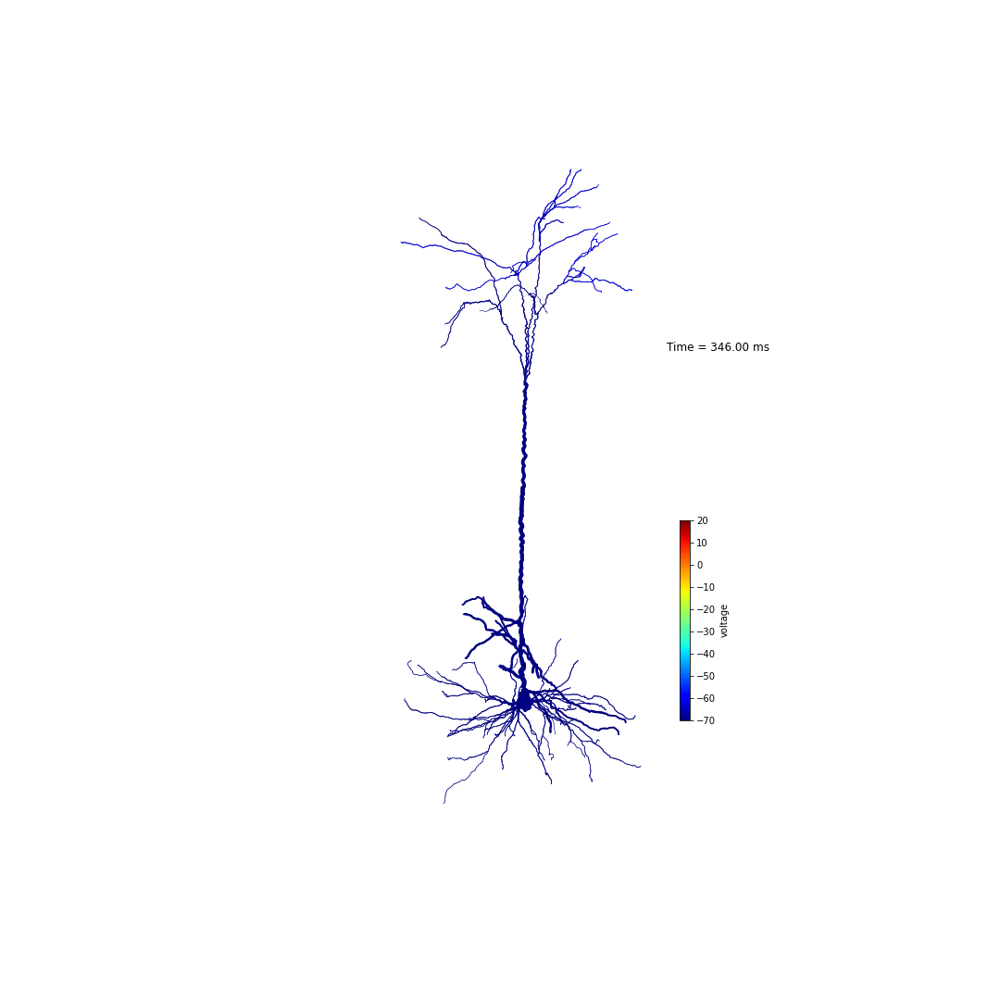
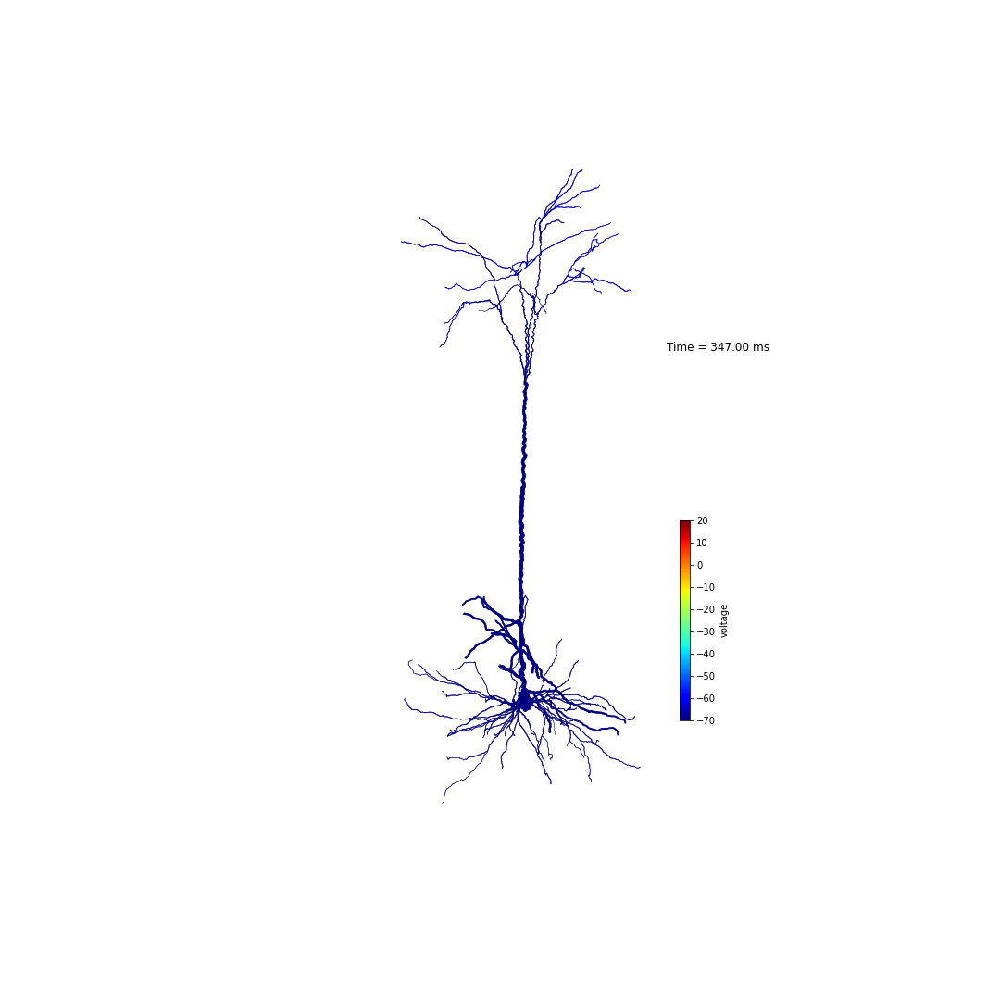
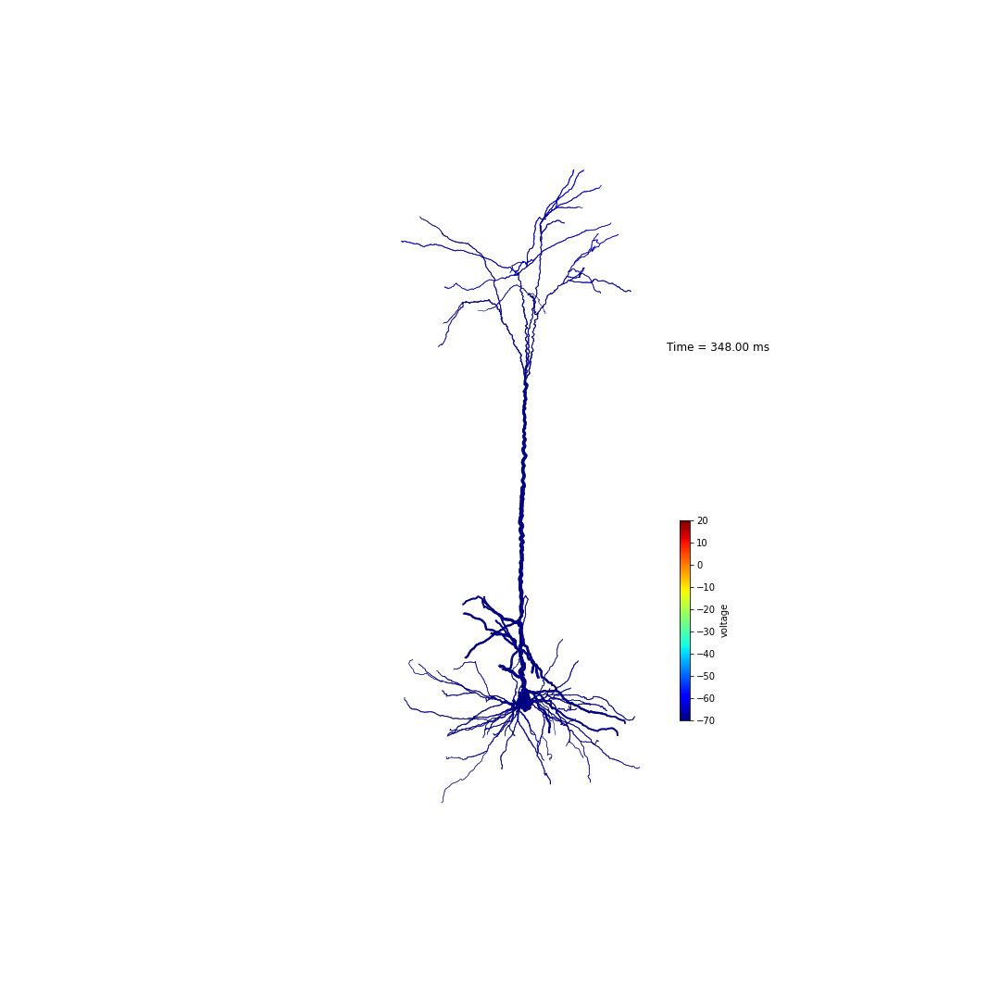
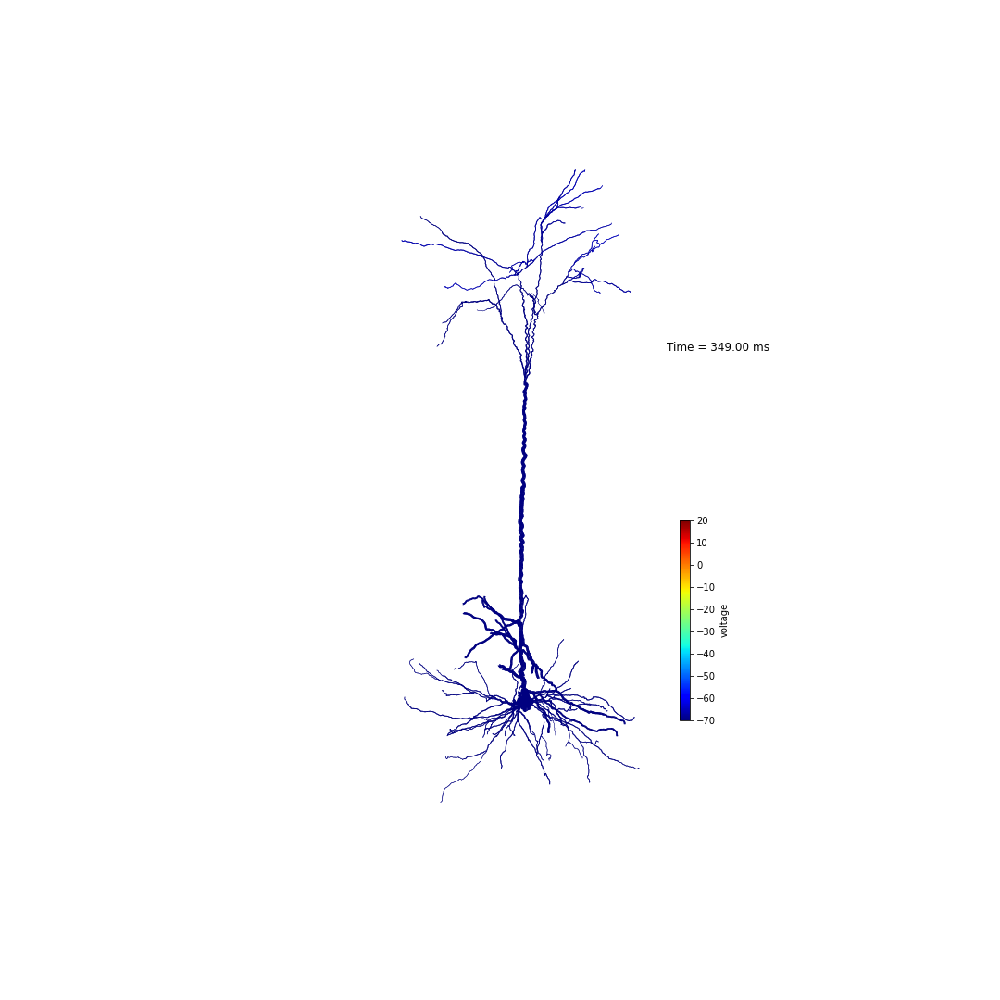
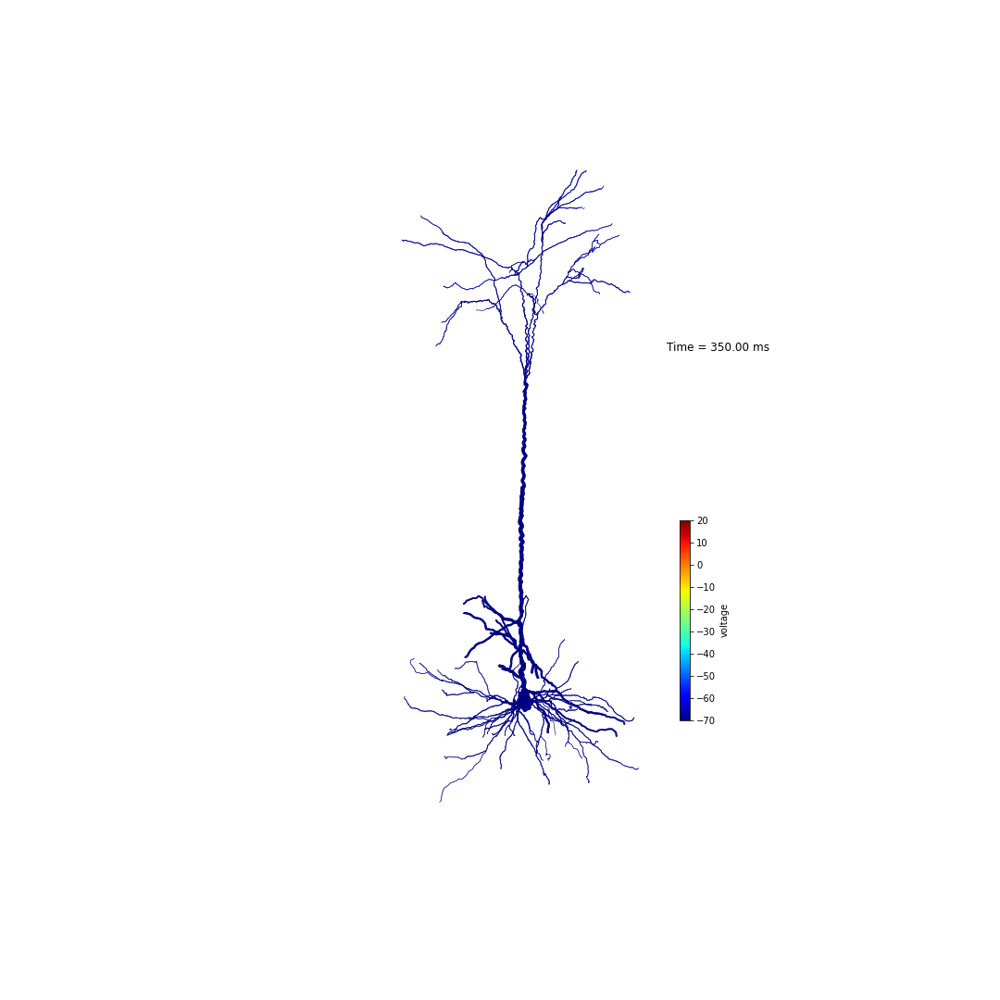

In [139]:
client = I.get_client()
client.restart()
outdir = I.os.path.join(db.basedir, 'burst_trail_video_3d')

# # To re-create: remove outdir
# if I.os.path.exists(outdir):
#     I.shutil.rmtree(outdir, ignore_errors=True)
    
cmv = I.CellMorphologyVisualizer(
    cell, 
    t_start=295, # Don't load all simulation data, only the interesting part
    t_end=350, # these are in [ms]
    t_step=1)
cmv.display_animation(
    images_path=outdir,
    show_legend=True,
    color="voltage",
    client=client);

Or visualize current through ion channels.


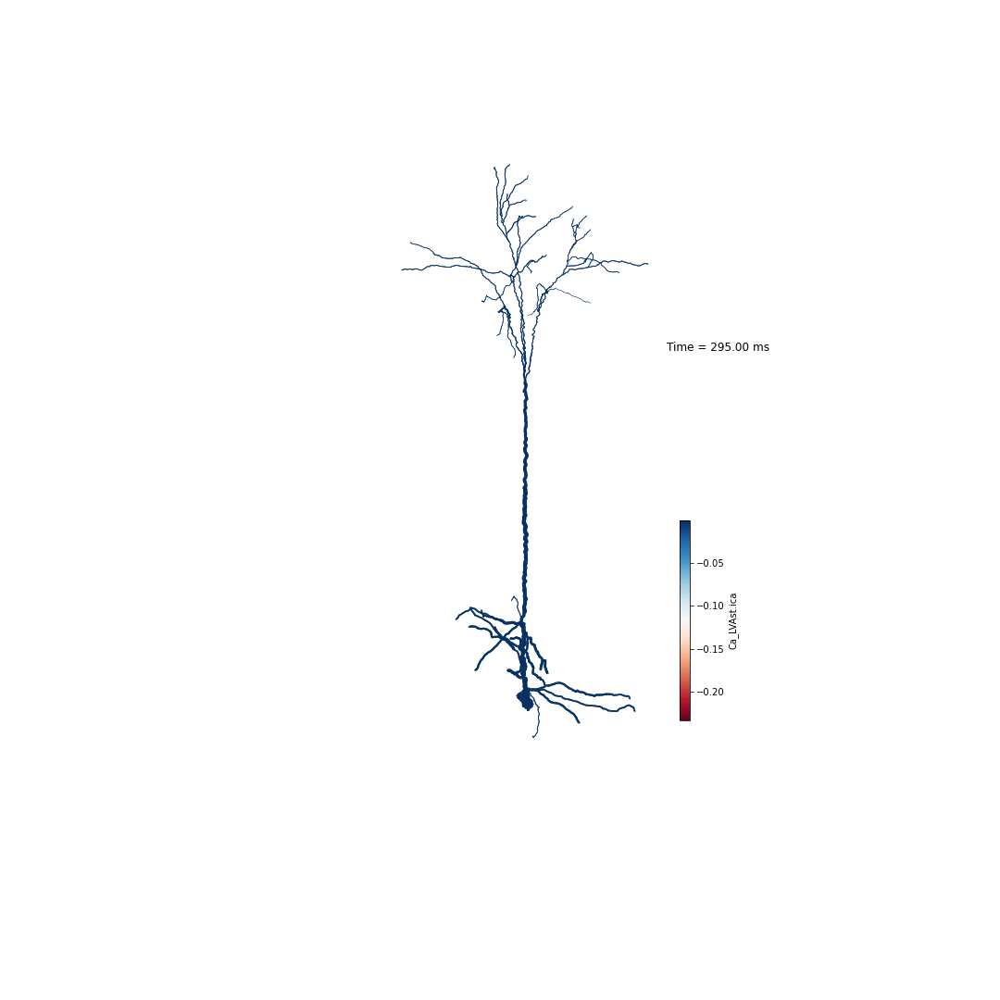
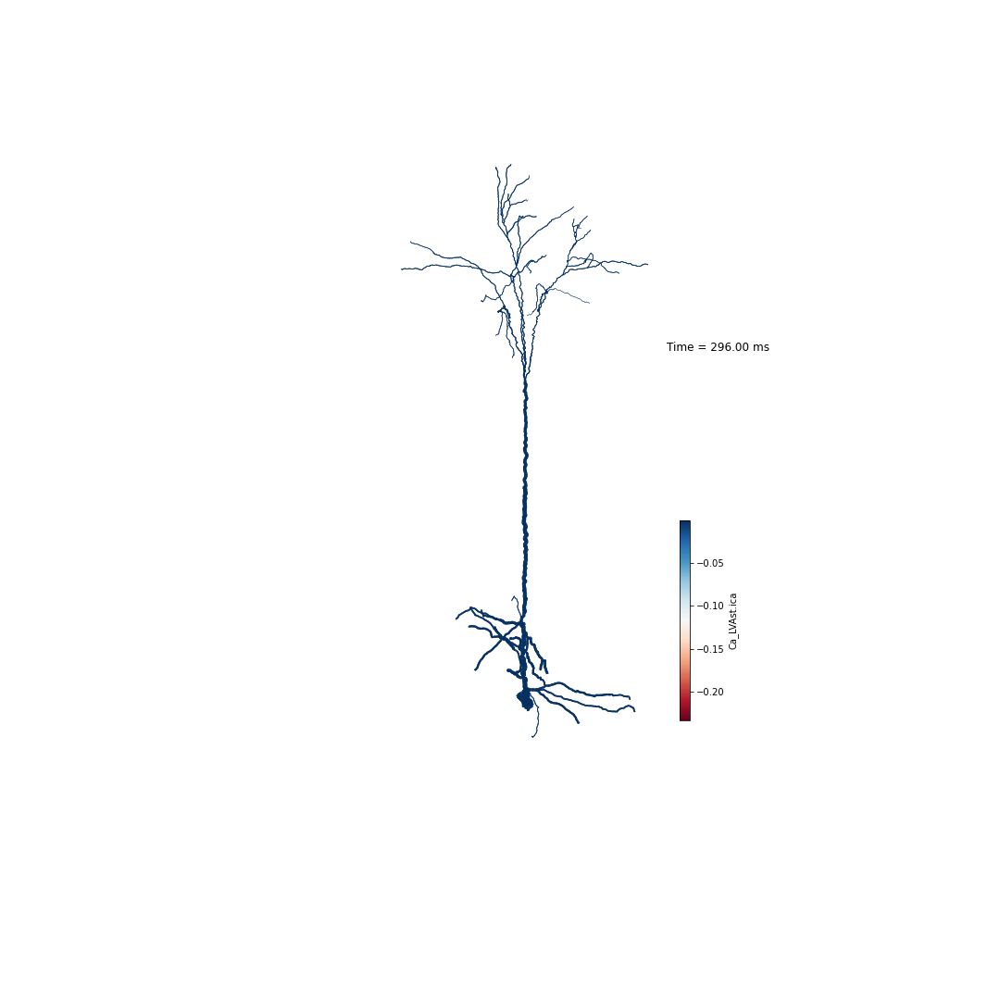
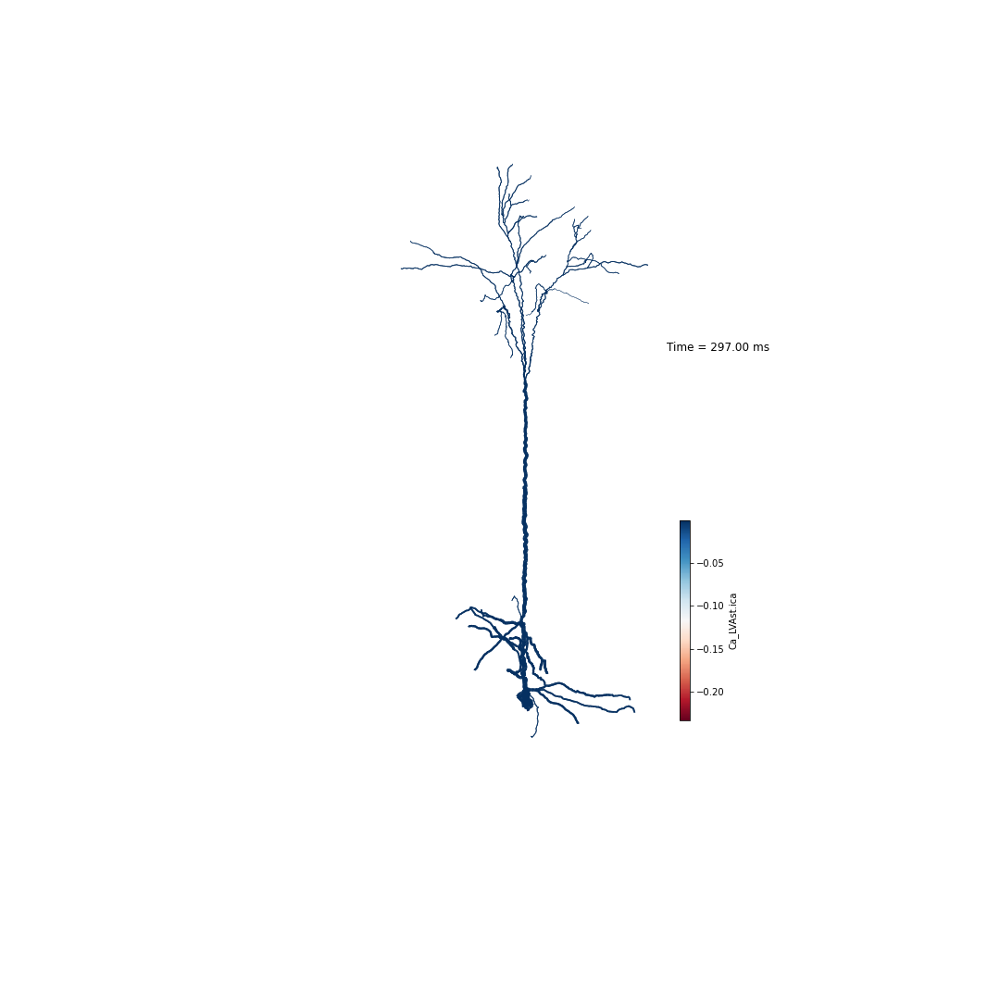
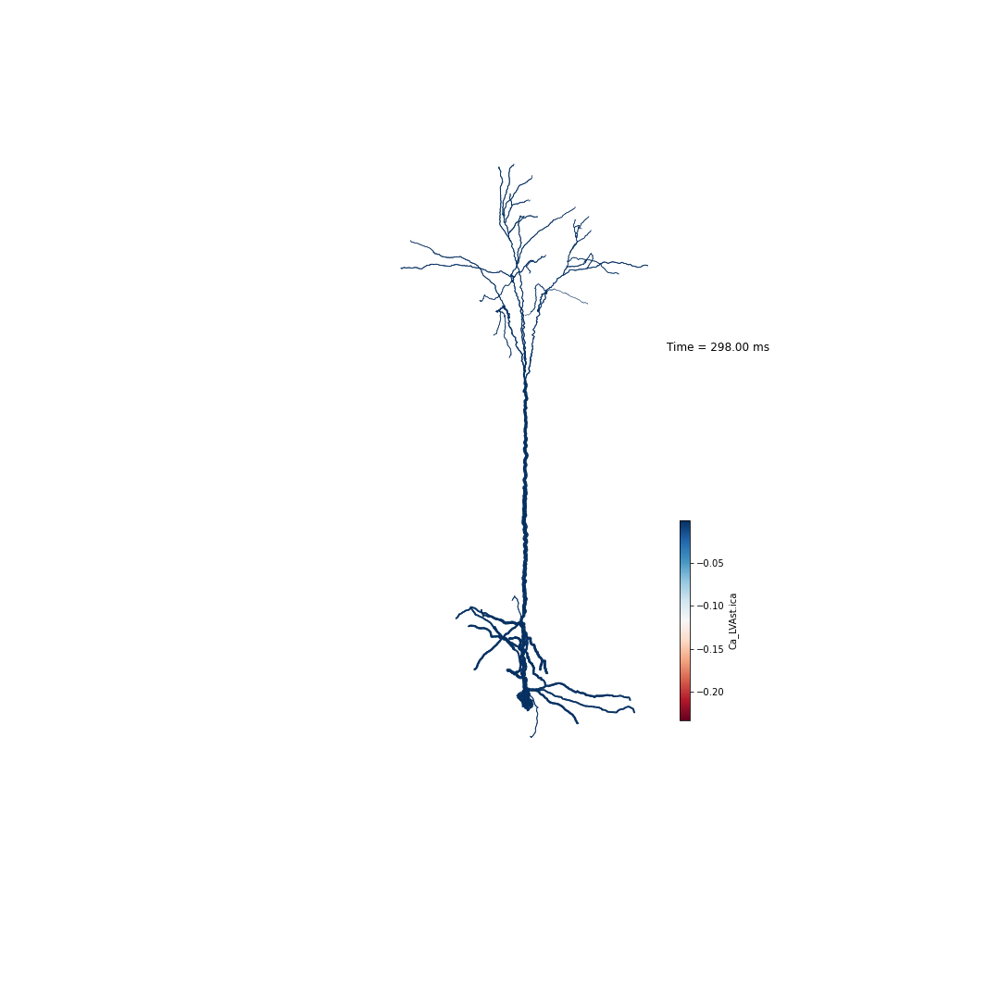
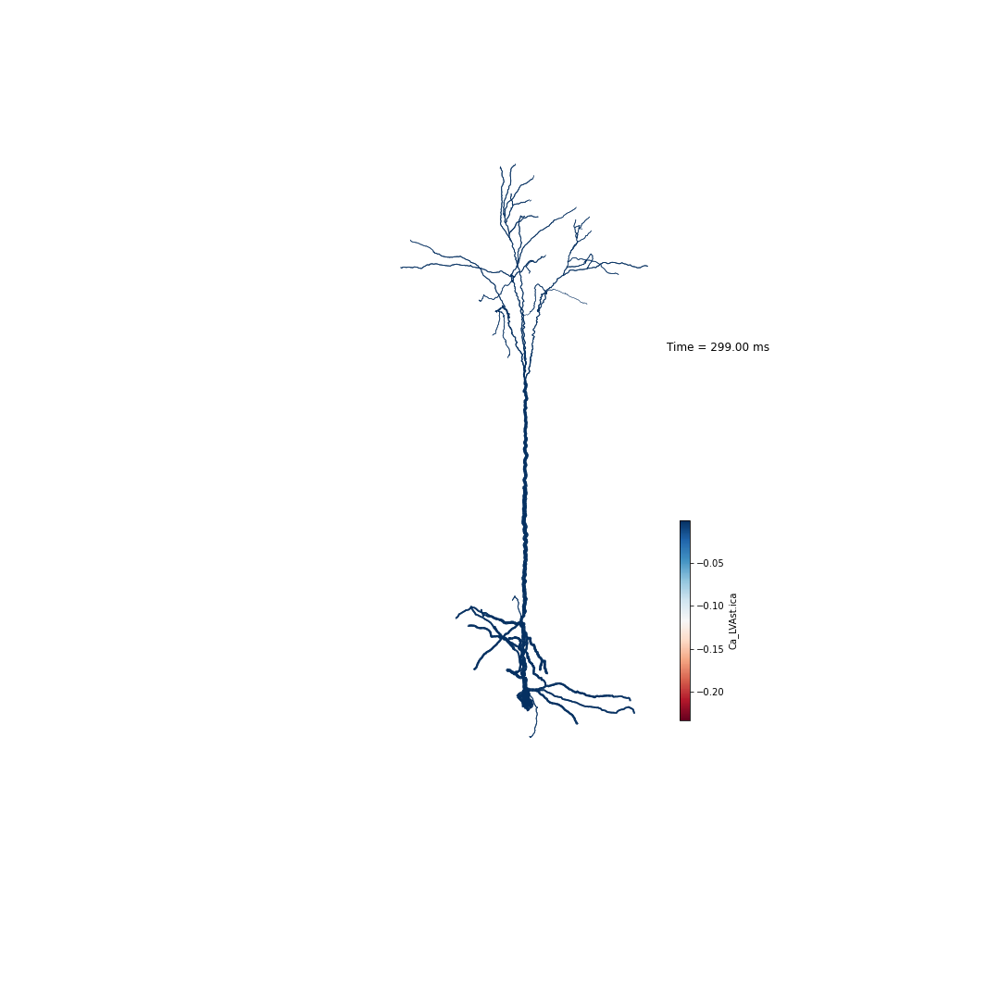
...
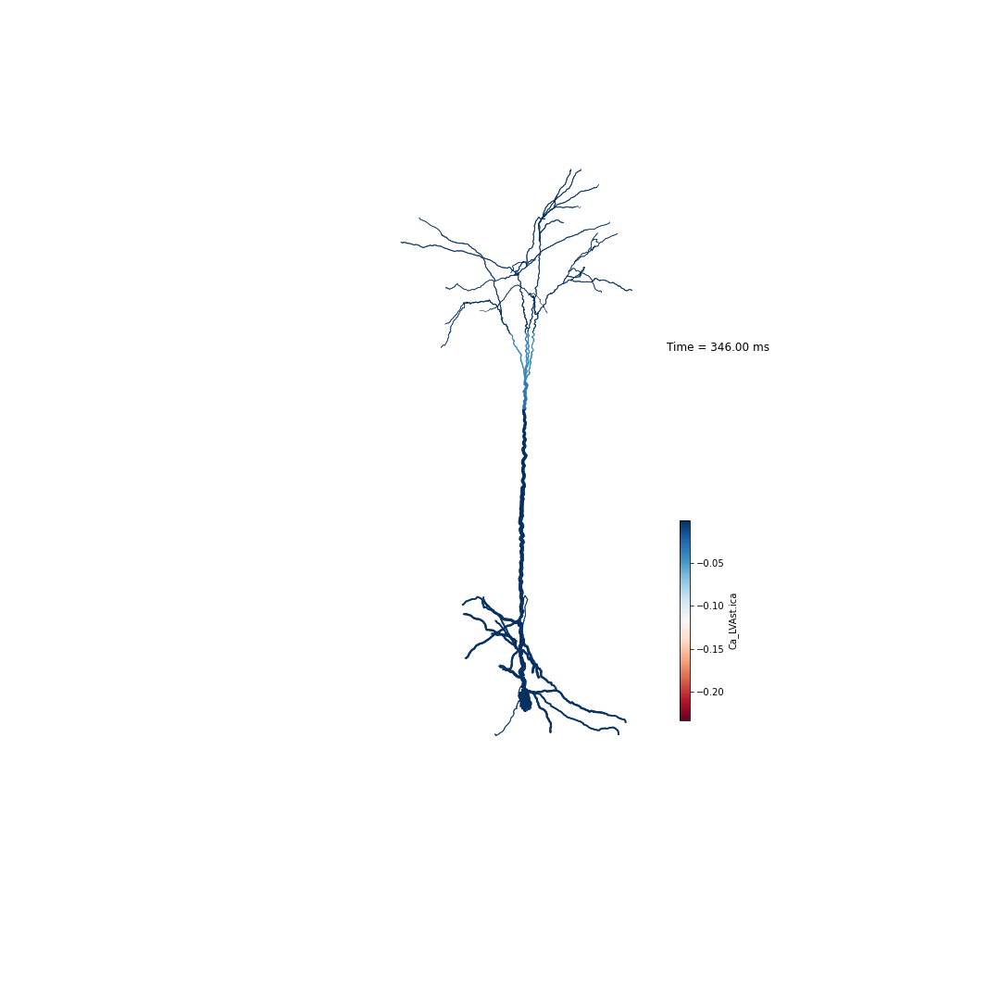
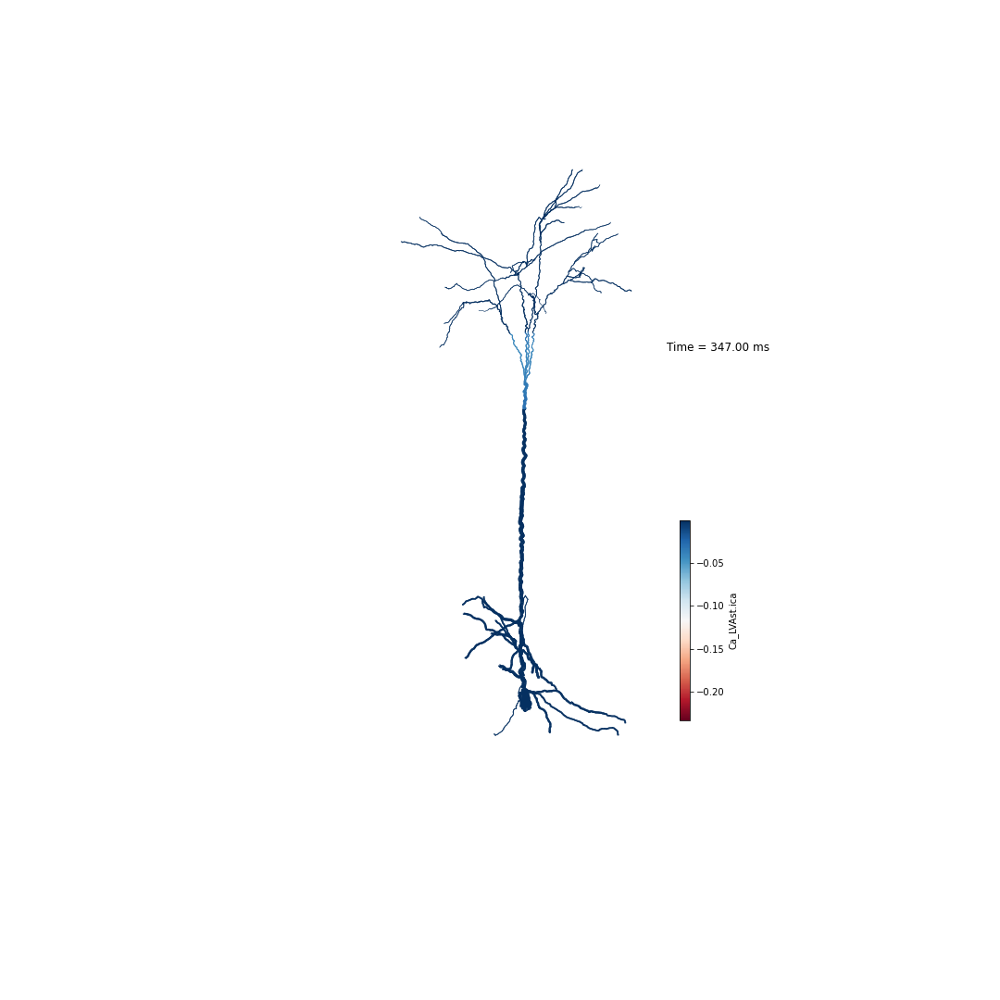
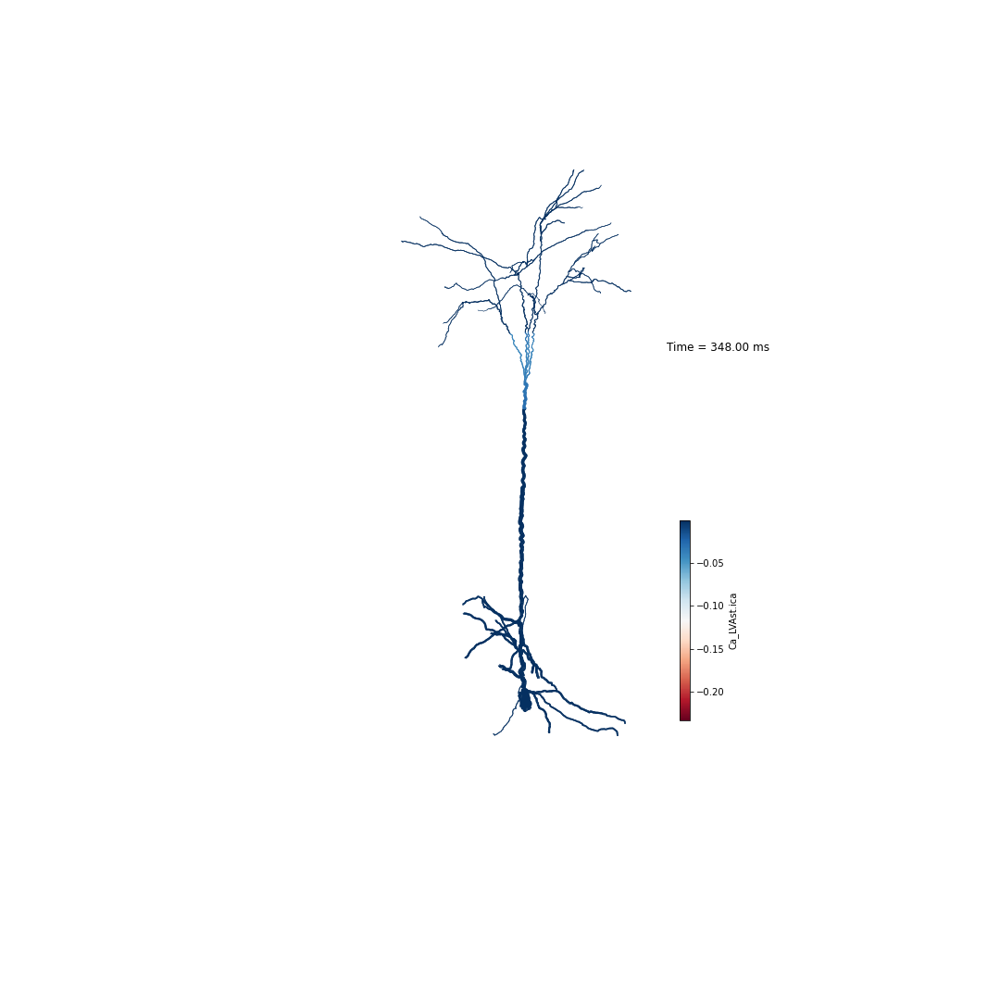
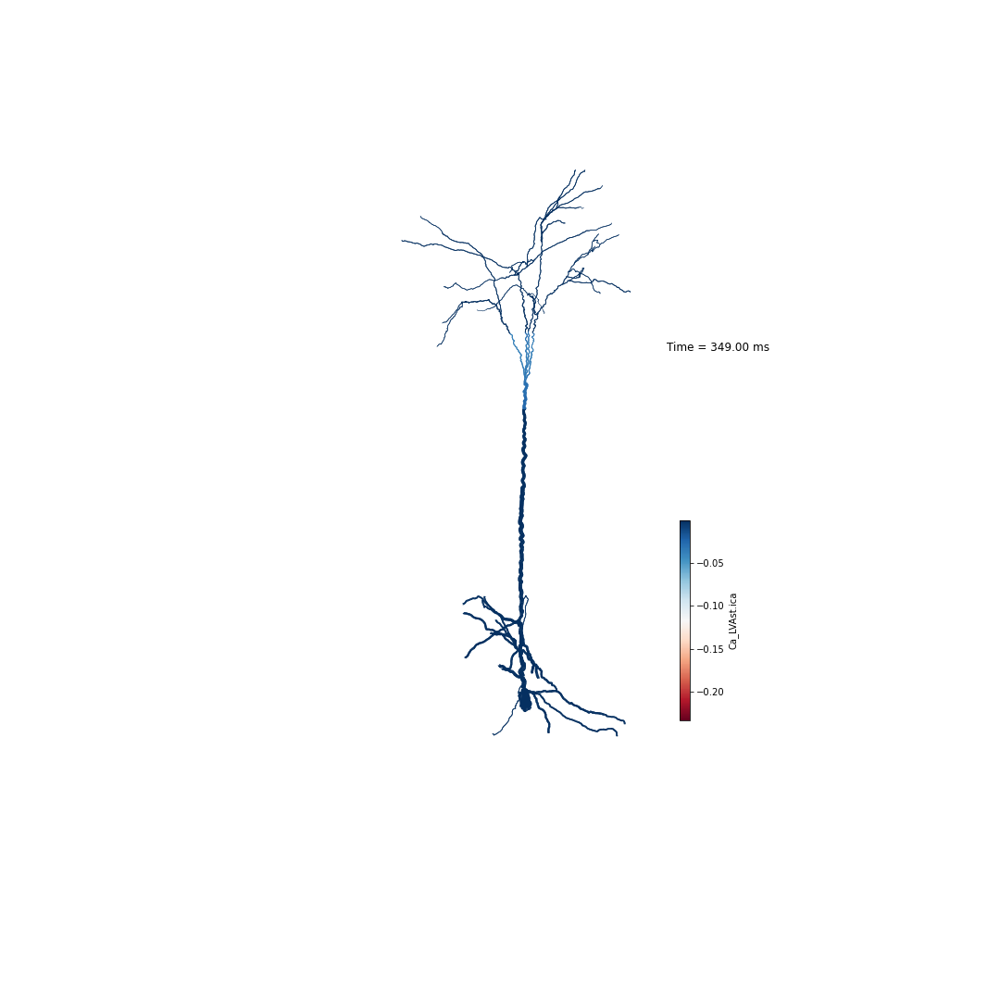
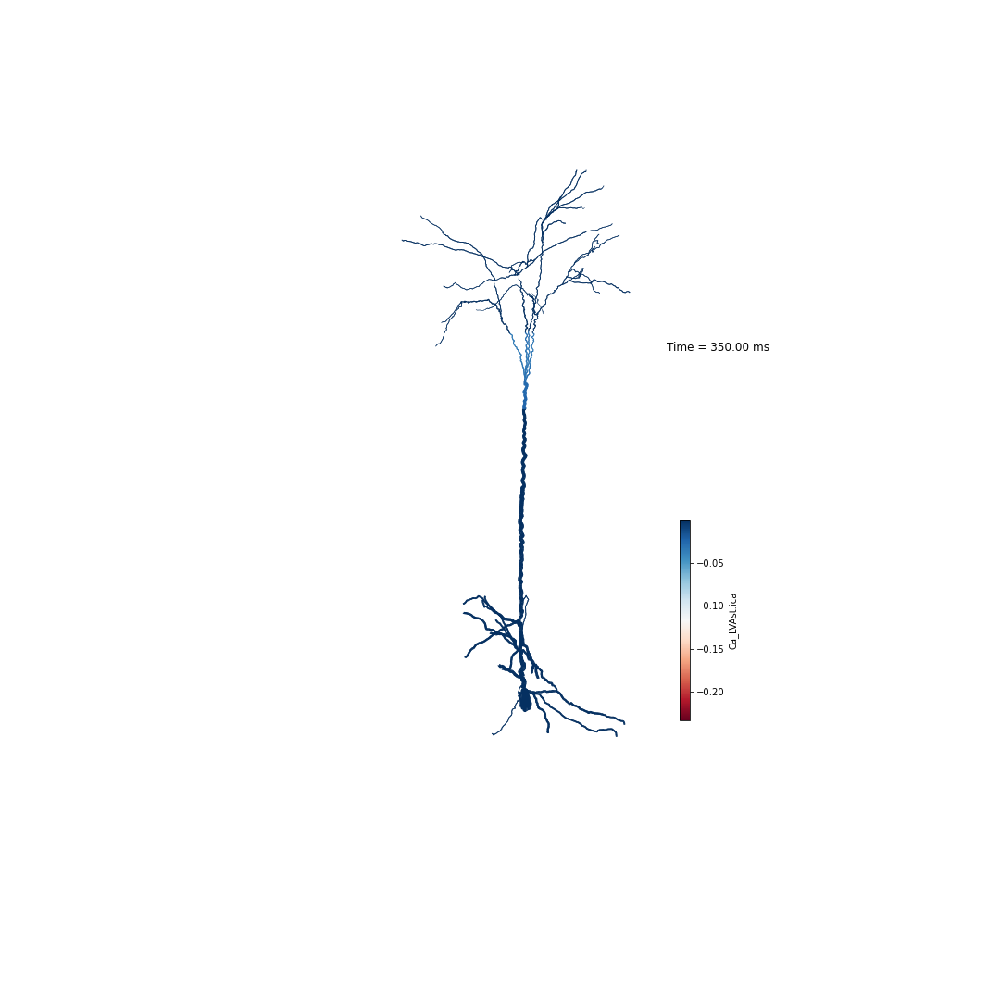

In [138]:
outdir = I.os.path.join(db.basedir, 'Ca_LVAst_video_3d')

# # To re-create: remove outdir
# if I.os.path.exists(outdir):
#     I.shutil.rmtree(outdir, ignore_errors=True)
    
cmv.set_cmap("RdBu")  # more visible 
cmv.display_animation(
    images_path=outdir,
    color="Ca_LVAst.ica",
    show_legend=True,
    client=client);